<a href="https://colab.research.google.com/github/ThanhHung2112/DO_AN_1/blob/main/VideoCapture.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
! pip install deepface
! pip install retina-face

In [2]:
# import dependencies
from IPython.display import display, Javascript, Image
from google.colab.output import eval_js
from base64 import b64decode, b64encode
import cv2
import numpy as np
import PIL
import io
import html
import time

In [3]:
from google.colab.patches import cv2_imshow
from retinaface import RetinaFace
from deepface import DeepFace
import cv2
import pandas as pd
from numpy import mean
import pandas as pd
from IPython.display import clear_output
from time import sleep
import matplotlib.pyplot as plt

Directory  /root /.deepface created
Directory  /root /.deepface/weights created


In [4]:
import moviepy.editor as mp

Imageio: 'ffmpeg-linux64-v3.3.1' was not found on your computer; downloading it now.
Try 1. Download from https://github.com/imageio/imageio-binaries/raw/master/ffmpeg/ffmpeg-linux64-v3.3.1 (43.8 MB)
Downloading: 8192/45929032 bytes (0.0%)2441216/45929032 bytes (5.3%)5734400/45929032 bytes (12.5%)8929280/45929032 bytes (19.4%)12517376/45929032 bytes (27.3%)15761408/45929032 bytes (34.3%)19210240/45929032 bytes (41.8%)22478848/45929032 bytes (48.9%)25411584/45929032 bytes (55.3%)28950528/45929032 bytes (63.0%)32391168/45929032 bytes (70.5%)35553280/45929032 bytes (77.4%)38912000/45929032 bytes (84.7%)

In [5]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [6]:
img = cv2.imread('/content/drive/MyDrive/DO_AN_1/database/IMG_1653043366611.jpeg')

obj_none = RetinaFace.detect_faces(img)

Downloading...
From: https://github.com/serengil/deepface_models/releases/download/v1.0/retinaface.h5
To: /root/.deepface/weights/retinaface.h5


retinaface.h5 will be downloaded from the url https://github.com/serengil/deepface_models/releases/download/v1.0/retinaface.h5


100%|██████████| 119M/119M [00:00<00:00, 119MB/s]


In [45]:
img = cv2.imread('/content/drive/MyDrive/DO_AN_1/database/Thanh_Hung.jpg')

obj = RetinaFace.detect_faces(img)

In [58]:
type(obj_none)

tuple

In [56]:
obj_none[0]

array([], shape=(0, 5), dtype=float64)

In [59]:
type(obj)

dict

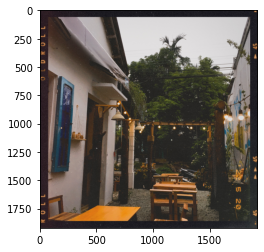

In [ ]:
plt.imshow(img[:,:,::-1])

In [6]:
# function to convert the JavaScript object into an OpenCV image
def js_to_image(js_reply):
  """
  Params:
          js_reply: JavaScript object containing image from webcam
  Returns:
          img: OpenCV BGR image
  """
  # decode base64 image
  image_bytes = b64decode(js_reply.split(',')[1])
  # convert bytes to numpy array
  jpg_as_np = np.frombuffer(image_bytes, dtype=np.uint8)
  # decode numpy array into OpenCV BGR image
  img = cv2.imdecode(jpg_as_np, flags=1)

  return img

# function to convert OpenCV Rectangle bounding box image into base64 byte string to be overlayed on video stream
def bbox_to_bytes(bbox_array):
  """
  Params:
          bbox_array: Numpy array (pixels) containing rectangle to overlay on video stream.
  Returns:
        bytes: Base64 image byte string
  """
  # convert array into PIL image
  bbox_PIL = PIL.Image.fromarray(bbox_array, 'RGBA')
  iobuf = io.BytesIO()
  # format bbox into png for return
  bbox_PIL.save(iobuf, format='png')
  # format return string
  bbox_bytes = 'data:image/png;base64,{}'.format((str(b64encode(iobuf.getvalue()), 'utf-8')))

  return bbox_bytes

In [7]:
def take_photo(filename='photo.jpg', quality=0.8):
  js = Javascript('''
    async function takePhoto(quality) {
      const div = document.createElement('div');
      const capture = document.createElement('button');
      capture.textContent = 'Capture';
      div.appendChild(capture);

      const video = document.createElement('video');
      video.style.display = 'block';
      const stream = await navigator.mediaDevices.getUserMedia({video: true});

      document.body.appendChild(div);
      div.appendChild(video);
      video.srcObject = stream;
      await video.play();

      // Resize the output to fit the video element.
      google.colab.output.setIframeHeight(document.documentElement.scrollHeight, true);

      // Wait for Capture to be clicked.
      await new Promise((resolve) => capture.onclick = resolve);

      const canvas = document.createElement('canvas');
      canvas.width = video.videoWidth;
      canvas.height = video.videoHeight;
      canvas.getContext('2d').drawImage(video, 0, 0);
      stream.getVideoTracks()[0].stop();
      div.remove();
      return canvas.toDataURL('image/jpeg', quality);
    }
    ''')
  display(js)

In [8]:
def video_frame(label, bbox):
  data = eval_js('stream_frame("{}", "{}")'.format(label, bbox))
  return data

In [9]:
from IPython.display import clear_output, Image
import base64

def arrayShow (imageArray):
    ret, jpg = cv2.imencode('.jpg', imageArray)
    encoded = base64.b64encode(jpg)
    return Image(data=encoded.decode('ascii'))

def detection_face_opencv (frame):
    # grayscale image for face detection
  gray = cv2.cvtColor(frame, cv2.COLOR_RGB2GRAY)
    # Detect the faces  
  faces = face_cascade.detectMultiScale(gray, 1.1, 4)  
    # Draw the rectangle around each face  
  for (x,y,w,h) in faces:
    bbox_array = cv2.rectangle(frame,(x,y),(x+w,y+h),(255,0,0),2)
  return frame

def detection_face_retinaface (frame):

  db_path = '/content/drive/MyDrive/DO_AN_1/database'
  img = frame

  obj = RetinaFace.detect_faces(img)
  
  if type(obj) == tuple: return img
  else:
    print('='*100,'\n'
        'found', len(obj.keys()), 'face in picture  ||','\n',
        '='*100)
    i = 1
    
    img = draw (obj,img)

      # text_size = (facial_area[2] - facial_area[0])/140
      # write up face
      # cv2.putText(img, 'Person.{}'.format(i) ,(facial_area[0],facial_area[1]- 15)
      # ,fontFace = cv2.FONT_HERSHEY_COMPLEX, fontScale = text_size, color = (0,0,255))
      # i += 1

    # df = DeepFace.find(img_path = img[facial_area[1]:facial_area[3],facial_area[0]:facial_area[2]]
    #                       , db_path =  db_path, detector_backend= 'retinaface')
    #   # #print(df)
    #   person_name = str(df['identity'][0].replace(path,'')).replace('.jpg','')

    # cv2.putText(img, person_name,(facial_area[0],facial_area[1] - 12),
    #                   fontFace = cv2.FONT_HERSHEY_COMPLEX, fontScale = 0.8, color = (250,225,100))

  return img


In [10]:
# JavaScript to properly create our live video stream using our webcam as input
def video_stream():
  js = Javascript('''
    var video;
    var div = null;
    var stream;
    var captureCanvas;
    var imgElement;
    var labelElement;
    
    var pendingResolve = null;
    var shutdown = false;
    
    function removeDom() {
       stream.getVideoTracks()[0].stop();
       video.remove();
       div.remove();
       video = null;
       div = null;
       stream = null;
       imgElement = null;
       captureCanvas = null;
       labelElement = null;
    }
    
    function onAnimationFrame() {
      if (!shutdown) {
        window.requestAnimationFrame(onAnimationFrame);
      }
      if (pendingResolve) {
        var result = "";
        if (!shutdown) {
          captureCanvas.getContext('2d').drawImage(video, 0, 0, 640, 480);
          result = captureCanvas.toDataURL('image/jpeg', 0.8)
        }
        var lp = pendingResolve;
        pendingResolve = null;
        lp(result);
      }
    }
    
    async function createDom() {
      if (div !== null) {
        return stream;
      }

      div = document.createElement('div');
      div.style.border = '2px solid black';
      div.style.padding = '3px';
      div.style.width = '100%';
      div.style.maxWidth = '600px';
      document.body.appendChild(div);
      
      const modelOut = document.createElement('div');
      modelOut.innerHTML = "<span>Status:</span>";
      labelElement = document.createElement('span');
      labelElement.innerText = 'No data';
      labelElement.style.fontWeight = 'bold';
      modelOut.appendChild(labelElement);
      div.appendChild(modelOut);
           
      video = document.createElement('video');
      video.style.display = 'block';
      video.width = div.clientWidth - 6;
      video.setAttribute('playsinline', '');
      video.onclick = () => { shutdown = true; };
      stream = await navigator.mediaDevices.getUserMedia(
          {video: { facingMode: "environment"}});
      div.appendChild(video);

      imgElement = document.createElement('img');
      imgElement.style.position = 'absolute';
      imgElement.style.zIndex = 1;
      imgElement.onclick = () => { shutdown = true; };
      div.appendChild(imgElement);
      
      const instruction = document.createElement('div');
      instruction.innerHTML = 
          '<span style="color: red; font-weight: bold;">' +
          'When finished, click here or on the video to stop this demo</span>';
      div.appendChild(instruction);
      instruction.onclick = () => { shutdown = true; };
      
      video.srcObject = stream;
      await video.play();

      captureCanvas = document.createElement('canvas');
      captureCanvas.width = 640; //video.videoWidth;
      captureCanvas.height = 480; //video.videoHeight;
      window.requestAnimationFrame(onAnimationFrame);
      
      return stream;
    }
    async function stream_frame(label, imgData) {
      if (shutdown) {
        removeDom();
        shutdown = false;
        return '';
      }

      var preCreate = Date.now();
      stream = await createDom();
      
      var preShow = Date.now();
      if (label != "") {
        labelElement.innerHTML = label;
      }
            
      if (imgData != "") {
        var videoRect = video.getClientRects()[0];
        imgElement.style.top = videoRect.top + "px";
        imgElement.style.left = videoRect.left + "px";
        imgElement.style.width = videoRect.width + "px";
        imgElement.style.height = videoRect.height + "px";
        imgElement.src = imgData;
      }
      
      var preCapture = Date.now();
      var result = await new Promise(function(resolve, reject) {
        pendingResolve = resolve;
      });
      shutdown = false;
      
      return {'create': preShow - preCreate, 
              'show': preCapture - preShow, 
              'capture': Date.now() - preCapture,
              'img': result};
    }
    ''')

  display(js)
  
def video_frame(label, bbox):
  data = eval_js('stream_frame("{}", "{}")'.format(label, bbox))
  return data

In [16]:
def draw (obj,bbox_array):

  db_path = '/content/drive/MyDrive/DO_AN_1/database'

  for key in obj.keys():
    identity = obj[key]
    # print(identity)
    facial_area = identity['facial_area']

    r_eye = identity['landmarks']['right_eye']
    l_eye = identity['landmarks']['left_eye']
    nose = identity['landmarks']['nose']
    mouth_left = identity['landmarks']['mouth_left']
    mouth_right = identity['landmarks']['mouth_right']

    # df = DeepFace.find(img_path = img[facial_area[1]:facial_area[3],facial_area[0]:facial_area[2]]
    #                    , db_path = db_path, detector_backend= 'mtcnn')
    # detect and draw line on eye, nose, mouth 
    cv2.line(bbox_array, (int(r_eye[0]),int(r_eye[1])), (int(l_eye[0]),int(l_eye[1])), (0,0,255), 2)
    cv2.line(bbox_array, (int(r_eye[0]),int(r_eye[1])), (int(nose[0]),int(nose[1])), (0,0,255), 2)
    cv2.line(bbox_array, (int(l_eye[0]),int(l_eye[1])), (int(nose[0]),int(nose[1])), (0,0,255), 2)
    x = (int(mouth_left[0]) + int(mouth_right[0]))/2
    y = (int(mouth_left[1]) + int(mouth_right[1]))/2
      
    cv2.line(bbox_array, (int(mouth_left[0]),int(mouth_left[1])), (int(mouth_right[0]),int(mouth_right[1])), (0,0,255), 2)
    cv2.line(bbox_array, (int(nose[0]),int(nose[1])), (int(x),int(y)), (255,0,0), 2)

    cv2.rectangle(bbox_array, (facial_area[2],facial_area[3]),(facial_area[0],facial_area[1]), (255,255,255), 2)
       
      #print(df)
    # person_name = str(df['identity'][0].replace(path,'')).replace('.jpg','')

    # cv2.putText(bbox_array, person_name,(facial_area[0],facial_area[1] - 12),
    #                   fontFace = cv2.FONT_HERSHEY_COMPLEX, fontScale = 0.8, color = (250,225,100))
  return bbox_array
          

In [12]:
from IPython.display import HTML
from base64 import b64encode

mp4 = open('/content/drive/MyDrive/IMG_4716.MOV', "rb").read()

print(mp4)
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML(f"""
<video width=400 controls>
      <source src="{data_url}" type="video/mp4">
</video>
""")


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [ ]:
# start streaming video from webcam
video_stream()
# label for video
label_html = 'Capturing...'
# initialze bounding box to empty
bbox = ''
Guess_face_adj = []
path = '/content/drive/MyDrive/DO_AN_1/database/'
while True:
  js_reply = video_frame(label_html, bbox)

  bbox_array = np.zeros([480,640,4], dtype=np.uint8)

  if not js_reply:
        break
  img = js_to_image(js_reply["img"])  
    
  obj = RetinaFace.detect_faces(img)

  if type(obj) == tuple:
    cv2.putText(bbox_array, 'No body here...',(30,30), #(facial_area[0],facial_area[1] - 12)
                      fontFace = cv2.FONT_HERSHEY_COMPLEX, fontScale = 0.8, color = (250,225,100))
  else: 
    bbox_array = draw(obj,bbox_array)

      # face_adj = DeepFace.analyze(img, detector_backend='retinaface')
      # x = []
      # for key in face_adj.keys() - ['emotion','region','race']:
      #   x.append(face_adj[key])  
      
      # if x != Guess_face_adj: 
      #   Guess_face_adj = x
      #   print(Guess_face_adj)  
  bbox_array[:,:,3] = (bbox_array.max(axis = 2) > 0 ).astype(int) * 255

  bbox_bytes = bbox_to_bytes(bbox_array)
      # update bbox so next frame gets new overlay
      #print('bbox:',bbox_array)      
  bbox = bbox_bytes # [  45 : 384 , 219: 466 ]

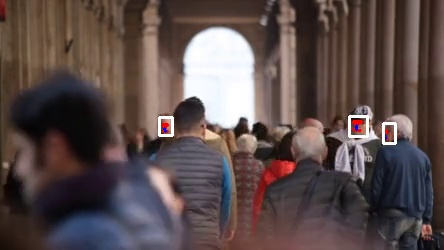

Video exsit ... 


In [17]:
path = '/content/Video Of People Walking.mp4'

# Load the cascade  
# face_cascade = cv2.CascadeClassifier(cv2.samples.findFile(cv2.data.haarcascades +
#                                                         'haarcascade_frontalface_default.xml'))

vid_name = '/content/Resize.mp4'
clip = mp.VideoFileClip(path)
clip_resized = clip.resize(height=250) # make the height 360px ( According to moviePy documenation The width is then computed so that the width/height ratio is conserved.)
clip_resized.write_videofile(vid_name)

video_capture = cv2.VideoCapture(vid_name)

if (video_capture.isOpened() == False):   print("Error opening video stream or file")

while video_capture.isOpened():
    ret, frame = video_capture.read()

    if ret == False: break
    # Try detect face with Opencv
    # img = detection_face_opencv(frame)

    # detect face with Reninaface
    img = detection_face_retinaface(frame)
    clear_output(wait=1/24)
    img = arrayShow(frame)
    display(img)
    # cv2_imshow(frame)
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

print('Video exsit ... ')

In [ ]:
import html
from IPython.display import display, Javascript, Image
from google.colab.output import eval_js

def preProcessVideo():
  js = Javascript('''
    const video = document.createElement('video');
    const labelElement = document.createElement('span');
    const videoUrl = 'https://rr2---sn-npoldn7z.c.drive.google.com/videoplayback?expire=1641882417&ei=8ercYbCiIuCKmvUPz5WB6Ac&ip=1.55.250.186&cp=QVRJU0lfUVRPSFhPOmpHU0F4ZW1JUnNobkNZVzY0MHlMYm44NDdNek45Nm5sSVQyTWota2J4MlE&id=8955091d9a3609fd&itag=18&source=webdrive&requiressl=yes&mh=yD&mm=32&mn=sn-npoldn7z&ms=su&mv=u&mvi=2&pl=27&ttl=transient&susc=dr&driveid=1S9PGt2CHDfuJSB1nIWebi4KVNRI7jEbf&app=explorer&mime=video/mp4&vprv=1&prv=1&dur=22.825&lmt=1641801389629564&mt=1641867503&txp=0011224&sparams=expire,ei,ip,cp,id,itag,source,requiressl,ttl,susc,driveid,app,mime,vprv,prv,dur,lmt&sig=AOq0QJ8wRgIhAJ8QuQoDRVLULTONbECJ9GyCqACa9Ci7i-4yK6vqgFdxAiEAoC-AMccHI239SCSOukNJEkXmqzKBIPqmb41I25Sjljs=&lsparams=mh,mm,mn,ms,mv,mvi,pl&lsig=AG3C_xAwRgIhAI650mDvui7WOdCTc-zfXSR_jXGCX0_marfJav3vEZDvAiEAz5-kvizrRBxJxmIZpO9LxDxkPQpcMTheY5Sq7pBMPQc=&cpn=BsF1Vhd4TGv91-3f&c=WEB_EMBEDDED_PLAYER&cver=1.20220109.00.00'

    async function playVideo() {
      const div = document.createElement('div');

      video.style.width = 320;
      video.style.height = 320;

      document.body.appendChild(div);
      div.appendChild(labelElement);
      div.appendChild(video);
      
      var source = document.createElement('source');

      source.setAttribute('src', videoUrl);
      source.setAttribute('type', 'video/mp4'); 
      video.appendChild(source);
      video.play();

      // Resize the output to fit the video element.
      google.colab.output.setIframeHeight(document.documentElement.scrollHeight, true);
    }
    ''')
  display(js)
  eval_js('playVideo()'.format())


In [ ]:
preProcessVideo()

<IPython.core.display.Javascript object>